# Second attempt at linear regression model to explain global sales

In [4]:
import pandas as pd
import pandas_profiling
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import statsmodels.api as sm
from statsmodels.graphics.gofplots import ProbPlot
from scipy import stats

In [24]:
%matplotlib inline

In [14]:
sales_joined = pd.read_csv("../clean_data/sales-joined.csv")

In [3]:
sales_joined.describe()

,rank,global_sales,na_sales,pal_sales,jp_sales,other_sales,year,critic_score,user_score
count,19834.000000,19834.000000,12773.000000,12123.000000,6768.000000,14499.000000,19834.000000,7952.000000,7384.00000
mean,9925.223303,0.531601,0.279823,0.168910,0.114507,0.047903,2007.403953,68.954351,7.13402
std,5733.868603,1.573721,0.515766,0.413661,0.187010,0.133507,25.495746,13.966903,1.49996
min,1.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,13.000000,0.00000
25%,4959.250000,0.050000,0.050000,0.020000,0.020000,0.000000,2004.000000,60.000000,6.40000
50%,9923.500000,0.160000,0.120000,0.050000,0.050000,0.010000,2008.000000,71.000000,7.50000
75%,14888.750000,0.450000,0.290000,0.160000,0.130000,0.040000,2012.000000,79.000000,8.20000
max,19862.000000,82.860000,9.760000,9.850000,2.690000,3.120000,2020.000000,98.000000,9.70000


Potential issues:
- outliers in sales columns
- rows with year == 0
- distribution of critic and user scores

In [5]:
pandas_profiling.ProfileReport(sales_joined)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
# remove certain games that were bundled with consoles
sales_joined = sales_joined.loc[sales_joined["name"] != "Wii Sports"]
sales_joined = sales_joined.loc[sales_joined["name"] != "Super Mario Bros."]

In [7]:
sales_joined.columns

Index(['rank', 'name', 'genre', 'esrb_rating', 'platform', 'publisher',
       'developer', 'global_sales', 'na_sales', 'pal_sales', 'jp_sales',
       'other_sales', 'year', 'critic_score', 'user_score'],
      dtype='object')

In [17]:
# drop columns we won't be needing
sales_joined.drop(['rank', 'name', 'developer'], axis=1, inplace=True)

In [18]:
# remove three rows where year is 0
sales_joined = sales_joined.loc[sales_joined["year"] != 0]

In [21]:
sales_joined.describe()

,global_sales,na_sales,pal_sales,jp_sales,other_sales,year,critic_score,user_score
count,19829.000000,12773.000000,12121.000000,6767.000000,14496.000000,19829.000000,7950.000000,7382.000000
mean,0.525521,0.279823,0.168932,0.114518,0.047913,2007.708861,68.956352,7.133839
std,1.433802,0.515766,0.413691,0.187022,0.133519,6.354889,13.966064,1.500120
min,0.010000,0.000000,0.000000,0.000000,0.000000,1970.000000,13.000000,0.000000
25%,0.050000,0.050000,0.020000,0.020000,0.000000,2004.000000,60.000000,6.400000
50%,0.160000,0.120000,0.050000,0.050000,0.010000,2008.000000,71.000000,7.500000
75%,0.450000,0.290000,0.160000,0.130000,0.040000,2012.000000,79.000000,8.200000
max,37.140000,9.760000,9.850000,2.690000,3.120000,2020.000000,98.000000,9.700000


In [22]:
pandas_profiling.ProfileReport(sales_joined)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

There are many columns with a substantial amount of missing values. We will be replacing the missing values with the the associated variable's mean.

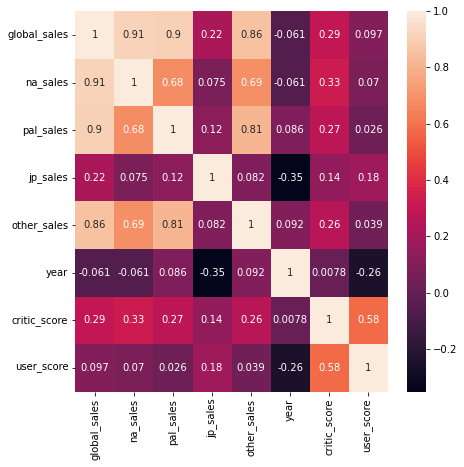

In [26]:
# look at correlation and plot heatmap
correlation = sales_joined.corr()
plt.figure(figsize=(7,7))
sns.heatmap(correlation, annot=True);

In [27]:
correlation["global_sales"].sort_values(ascending=False)

global_sales    1.000000
na_sales        0.914597
pal_sales       0.903237
other_sales     0.855722
critic_score    0.294597
jp_sales        0.221712
user_score      0.097225
year           -0.061268
Name: global_sales, dtype: float64

Strong correlation between na/pal sales and global sales, could potentially indicate that a game that performs well in North America or Europe is likely to perform well globally.

Also interesting to note that critic scores are more correlated to global sales than user scores are.

<Figure size 504x504 with 0 Axes>

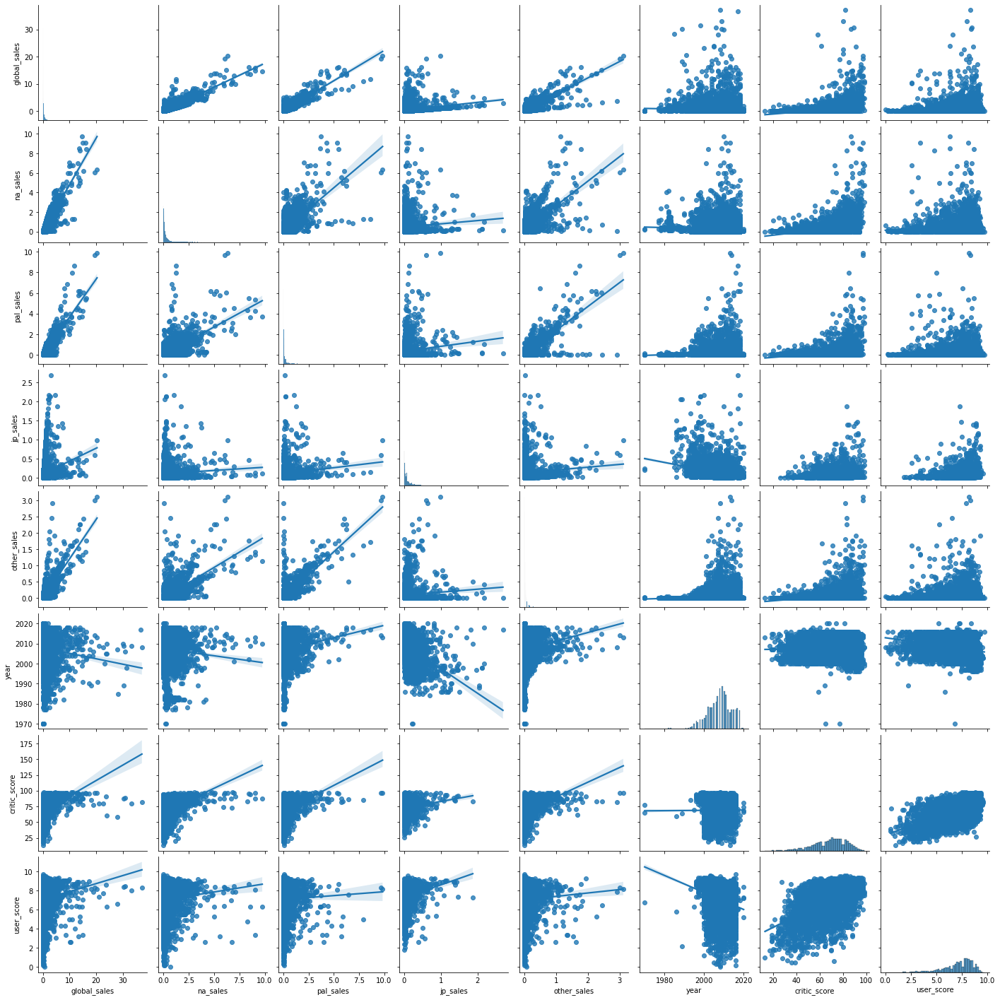

In [29]:
# variable distribution
plt.figure(figsize=(7,7))
sns.pairplot(sales_joined, kind="reg");

All sales columns appear to be heavily right skewed. Critic and user score looks better, but left skewed. Outliers to deal with in many columns.

In [32]:
# look at skewness per column
for column in sales_joined[['global_sales', 'na_sales', 'pal_sales', 'jp_sales', 'other_sales', 'year', \
                           'critic_score', 'user_score']].columns.values.tolist():
    print(column)
    print(sales_joined[column].skew())
    print()

global_sales
10.556370934968717

na_sales
6.4345944256865355

pal_sales
8.786859123829345

jp_sales
4.56899575356718

other_sales
9.083983534764267

year
-0.8087338675309454

critic_score
-0.610669523803431

user_score
-1.2542147910079844



Most of the columns are heavily skewed, with a skewness magnitude higher than 1.

critic_score and year are moderately left skewed.